In [1]:
import itertools
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import warnings
import scienceplots
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

plt.style.use(['ieee','no-latex'])
plt.rcParams['legend.fontsize'] = 12
plt.rcParams['axes.labelsize'] = 15
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['figure.titlesize'] = 20
warnings.filterwarnings('ignore')
sns.set_style('dark')


# Restart (vary only one parameter at a time)

In [47]:
def train_given_data(df):

    lower_lim = len(df['ID'].unique())-5
    X_train = df[df['ID'] <= lower_lim]\
        [['Flow_rate', 'Volume', 'Ca0', 'Cb0', 'Cx0', 'Cyo', 'Czo','Time']]
    y_train = df[df['ID'] <= lower_lim][['Caf', 'Cbf', 'Cxf', 'Cyf', 'Czf']]
    X_test = df[(lower_lim < df['ID'])]\
        [['Flow_rate', 'Volume', 'Ca0', 'Cb0', 'Cx0', 'Cyo', 'Czo','Time']]
    y_test = df[(lower_lim < df['ID'])][['Caf', 'Cbf', 'Cxf', 'Cyf', 'Czf']]

    # Standardize features
    scaler_X = StandardScaler()
    X_train_scaled = scaler_X.fit_transform(X_train)
    X_test_scaled = scaler_X.transform(X_test)

    scaler_y = StandardScaler()
    y_train_scaled = scaler_y.fit_transform(y_train)

    # Define a simple PyTorch model
    class PINNModel(nn.Module):
        def __init__(self, input_size, hidden_layers, hidden_nodes, output_size):
            super(PINNModel, self).__init__()

            # Input layer
            self.layers = [nn.Linear(input_size, hidden_nodes), nn.Tanh()]

            # Hidden layers
            for _ in range(hidden_layers - 1):
                self.layers.extend([nn.Linear(hidden_nodes, hidden_nodes), nn.Tanh()])

            # Output layer
            self.layers.append(nn.Linear(hidden_nodes, output_size))

            # Create the sequential model
            self.model = nn.Sequential(*self.layers)

        def forward(self, x):
            return self.model(x)

    # Convert data to PyTorch tensors
    X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32).to(device)
    y_train_tensor = torch.tensor(y_train_scaled, dtype=torch.float32).to(device)
    X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32).to(device)

    # Parameters
    input_size = X_train_tensor.shape[1]
    hidden_layers = 4
    hidden_nodes = 256
    output_size = 5
    batch_size = 500
    num_epochs = 100

    # Initialize the PyTorch model, loss function, and optimizer
    model = PINNModel(input_size, hidden_layers, hidden_nodes, output_size).to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # DataLoader for batching
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    # Lists to store training history
    mse_history_train = []
    r2_history_train = []
    mse_history_val = []
    r2_history_val = []

    # Training loop
    progress_bar = tqdm(range(num_epochs), desc="Training")

    for _ in progress_bar:
        # Training
        model.train()
        for batch_X, batch_y in train_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)  # Move data to GPU
            optimizer.zero_grad()
            outputs = model(batch_X)
            loss = criterion(outputs, batch_y)
            loss.backward()
            optimizer.step()

        # Validation
        model.eval()
        with torch.no_grad():
            # Predict on training set
            y_train_pred = model(X_train_tensor).cpu().numpy()
            y_train_pred = scaler_y.inverse_transform(y_train_pred)

            # Predict on validation set
            y_val_pred = model(X_test_tensor).cpu().numpy()
            y_val_pred = scaler_y.inverse_transform(y_val_pred)

            # Calculate metrics
            mse_train = mean_squared_error(y_train, y_train_pred)
            r2_train = r2_score(y_train, y_train_pred)
            mse_val = mean_squared_error(y_test, y_val_pred)
            r2_val = r2_score(y_test, y_val_pred)

            # Append metrics to history
            mse_history_train.append(mse_train)
            r2_history_train.append(r2_train)
            mse_history_val.append(mse_val)
            r2_history_val.append(r2_val)

        progress_bar.set_postfix({'MSE (Train)': mse_train, 'MSE (Val)': mse_val, 
                                  'R2 (Train)': r2_train, 'R2 (Val)': r2_val})
    
    # Plot training and validation loss over epochs
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(mse_history_train, label='Training Loss')
    plt.plot(mse_history_val, label='Validation Loss')
    plt.title(f'Final MSE: {mse_history_val[-1]:.2e}')
    plt.xlabel('Epoch')
    plt.ylabel('Mean Squared Error')
    plt.legend()

    # Plot training and validation R2 score over epochs
    plt.subplot(1, 2, 2)
    plt.plot(r2_history_train, label='Train $R^2$')
    plt.plot(r2_history_val, label='Validation $R^2$')
    plt.title(f'Final R2 Score: {r2_history_val[-1]:.2e}')
    plt.xlabel('Epoch')
    plt.ylabel('R-squared Score')
    plt.ylim(0,1)
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Extract features for the new test set
    features_test = X_test

    # Standardize features
    features_test_scaled = scaler_X.transform(features_test)

    # Convert to PyTorch tensor
    X_tensor = torch.tensor(features_test_scaled, dtype=torch.float32).to(device)

    # Ensure the model is in evaluation mode
    model.eval()

    # Predict concentrations using the trained model
    with torch.no_grad():
        y_pred_test_scaled = model(X_tensor).cpu().numpy()
        y_pred_test = scaler_y.inverse_transform(y_pred_test_scaled)

    # Plot actual concentration values and predicted concentration values against time
    time_values = range(y_test.shape[0])

    plt.figure(figsize=(12, 20))
    for i, col in enumerate(y_test.columns):
        plt.subplot(5, 1, i + 1)
        plt.plot(time_values, y_test[col], '.', label='Actual', alpha=0.5)
        plt.plot(time_values, y_pred_test[:, i], '.', label='Predicted', alpha=0.5)
        plt.title(f'Actual vs Predicted {col}')
        plt.xlabel('Time')
        plt.ylabel('Concentration')
        plt.legend()

    plt.tight_layout()
    plt.show()

## Vary Volume

Training:   0%|          | 0/100 [00:00<?, ?it/s]

Training: 100%|██████████| 100/100 [00:07<00:00, 13.76it/s, MSE (Train)=6.03e-7, MSE (Val)=8.88e-6, R2 (Train)=0.977, R2 (Val)=0.808]


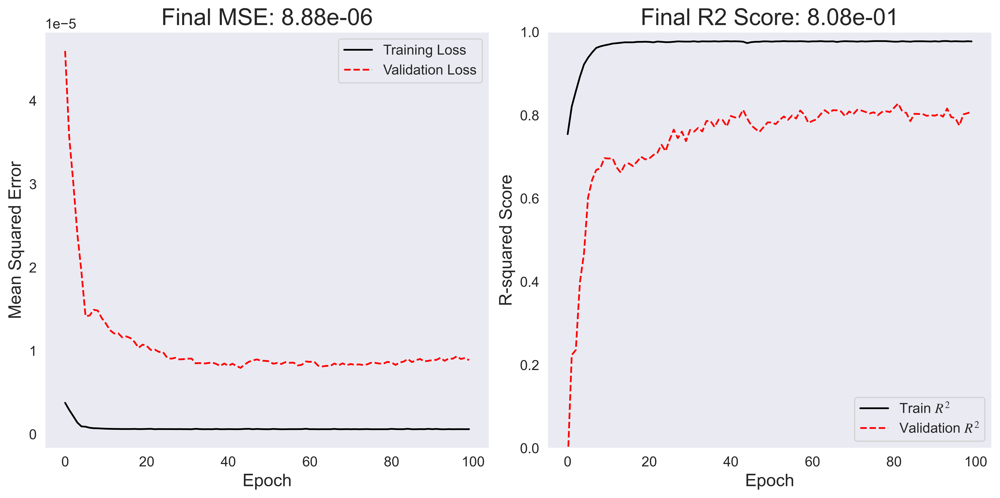

In [49]:
train_given_data(pd.read_csv('simplify_noise/train_volume.csv'))